In [75]:
!git clone https://github.com/KyleMcQ/Images_CA2.git

fatal: destination path 'Images_CA2' already exists and is not an empty directory.


In [76]:
!ls Images_CA2

driving_log.csv  IMG


In [77]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPool2D, Dropout, Flatten, Dense
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa

In [78]:
def path_leaf(path):
  head,tail = ntpath.split(path)
  return tail

In [79]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    centre,left,right = indexed_data[0], indexed_data[1],indexed_data[2]
    image_path.append(os.path.join(datadir,centre.strip()))
    steering.append(float(indexed_data[3]))
    image_path.append(os.path.join(datadir, left.strip()))
    steering.append(float(indexed_data[3]) + 0.2)
    image_path.append(os.path.join(datadir, right.strip()))
    steering.append(float(indexed_data[3]) - 0.2)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [80]:
def preprocess_img(img):
  img = mpimg.imread(img)
  img = img[64:140, 0:320, :]
  img = cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img,(3,3),0)
  img = cv2.resize(img, (200,66))
  img = img/255
  return img

In [81]:
def preprocessed_img_no_imread(img):
  img = img[64:140, 0:320, :]
  img = cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img,(3,3),0)
  img = cv2.resize(img, (200,66))
  img = img/255
  return img

In [82]:
#https://arxiv.org/pdf/1604.07316v1.pdf
def nvidia_model():
  model = Sequential()#66x200
  model.add(Convolution2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3) ,activation='elu')) # 31 x 98
  model.add(Convolution2D(36, kernel_size=(5,5), strides=(2,2), activation='elu')) # 14 x 47
  model.add(Convolution2D(48, kernel_size=(5,5), strides=(2,2), activation='elu')) # 5 x 22
  model.add(Convolution2D(64, kernel_size=(3,3), activation='elu')) #3x20
  model.add(Convolution2D(64, kernel_size=(3,3), activation='elu'))# 1 x 18
  model.add(Flatten())
  model.add(Dense(100,activation= 'elu'))
  model.add(Dropout(.3))
  model.add(Dense(50, activation='elu'))
  # model.add(Dropout(.5))
  model.add(Dense(10,activation= 'elu'))
  model.add(Dense(1))
  optimizer = Adam(learning_rate=0.0001)
  model.compile(loss='mse', optimizer=optimizer)
  return model

In [83]:
def zoom(image_to_zoom):
  zoom_func = iaa.Affine(scale=(1,1.3))
  z_image = zoom_func.augment_image(image_to_zoom)
  return z_image

In [84]:
def pan(image_to_pan):
  pan_func = iaa.Affine(translate_percent={"x": (-0.1,0.1), "y": (-0.1,0.1)})
  pan_image = pan_func.augment_image(image_to_pan)
  return pan_image

In [85]:
def img_random_brightness(image_to_brighten):
  bright_func = iaa.Multiply((0.2,1.2))
  bright_image = bright_func.augment_image(image_to_brighten).astype("uint8")
  return bright_image

In [86]:
def img_random_flip(image_to_flip,steering_angle):
  flipped_image = cv2.flip(image_to_flip,1)
  steering_angle = -steering_angle
  return flipped_image, steering_angle

In [87]:
def random_shadow(image_to_shadow):
  shadow_func = iaa.AdditiveGaussianNoise(scale=(0.5,0.7))
  shadow_image = shadow_func.augment_image(image_to_shadow)
  return shadow_image

In [88]:
def img_random_shear(image_to_shear):
    shear_func = iaa.Affine(shear=(-10, 10))
    sheared_image = shear_func.augment_image(image_to_shear)
    return sheared_image

In [89]:
def img_random_color_jitter(image_to_jitter):
    jitter_func = iaa.AddToHueAndSaturation((-20, 20), per_channel=True)
    jittered_image = jitter_func.augment_image(image_to_jitter)
    return jittered_image

In [90]:
def img_perspective_transform(image_to_transform):
    perspective_func = iaa.PerspectiveTransform(scale=(0.01, 0.15))
    perspective_image = perspective_func.augment_image(image_to_transform)
    return perspective_image

In [91]:
def img_random_noise(image_to_noise):
    noise_func = iaa.AdditiveGaussianNoise(loc=0, scale=(0.01*255, 0.05*255))
    noisy_image = noise_func.augment_image(image_to_noise)
    return noisy_image

In [92]:
def random_augment(image_to_augment,steering_angle):
  augment_image = mpimg.imread(image_to_augment)
  if np.random.rand() < 0.5:
    augment_image = zoom(augment_image)
  if np.random.rand() < 0.5:
    augment_image = pan(augment_image)
  if np.random.rand() < 0.5:
    augment_image = img_random_brightness(augment_image)
  if np.random.rand() < 0.5:
    augment_image, steering_angle = img_random_flip(augment_image,steering_angle)
  if np.random.rand() < 0.5:
    augment_image = random_shadow(augment_image)
  if np.random.rand() < 0.5:
    augment_image = img_random_shear(augment_image)
  if np.random.rand() < 0.5:
    augment_image = img_random_color_jitter(augment_image)
  if np.random.rand() < 0.5:
    augment_image = img_perspective_transform(augment_image)
  if np.random.rand() < 0.5:
    augment_image = img_random_noise(augment_image)
  return augment_image, steering_angle


In [93]:
def batch_generator(image_paths, steering_ang,batch_size,is_training):
  while True:
    batch_img = []
    batch_steering = []
    for i in range(batch_size):
      random_index = random.randint(0,len(image_paths)-1)
      if is_training:
        im,steering = random_augment(image_paths[random_index],steering_ang[random_index])
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = preprocessed_img_no_imread(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield np.asarray(batch_img), np.asarray(batch_steering)

In [94]:
datadir = "Images_CA2" # Change to TrackTwo
columns = ["center", "left","right","steering","throttle","reverse","speed"]
data = pd.read_csv(os.path.join(datadir,"driving_log.csv"),names=columns)
pd.set_option('display.max_columns', 7)
print(data.head)

<bound method NDFrame.head of                                                   center  \
0      C:\Users\kylem\Desktop\Training Data\IMG\cente...   
1      C:\Users\kylem\Desktop\Training Data\IMG\cente...   
2      C:\Users\kylem\Desktop\Training Data\IMG\cente...   
3      C:\Users\kylem\Desktop\Training Data\IMG\cente...   
4      C:\Users\kylem\Desktop\Training Data\IMG\cente...   
...                                                  ...   
54598  C:\Users\kylem\Desktop\Training Data\IMG\cente...   
54599  C:\Users\kylem\Desktop\Training Data\IMG\cente...   
54600  C:\Users\kylem\Desktop\Training Data\IMG\cente...   
54601  C:\Users\kylem\Desktop\Training Data\IMG\cente...   
54602  C:\Users\kylem\Desktop\Training Data\IMG\cente...   

                                                    left  \
0      C:\Users\kylem\Desktop\Training Data\IMG\left_...   
1      C:\Users\kylem\Desktop\Training Data\IMG\left_...   
2      C:\Users\kylem\Desktop\Training Data\IMG\left_...   
3      C:

In [95]:
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)

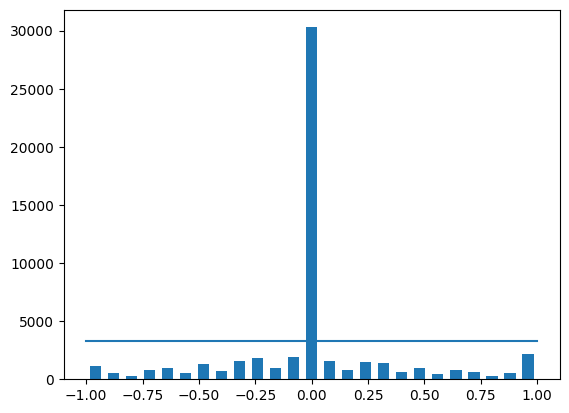

In [96]:
num_bins = 25
samples_per_bin = 3300
hist,bins = np.histogram(data['steering'],num_bins)
centre = (bins[:-1] + bins[1:]) * 0.5
plt.bar(centre, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))
plt.show()

In [97]:
remove_list = []
print('total data:', len(data))
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)
print('removed', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

total data: 54603
removed 26991
remaining: 27612


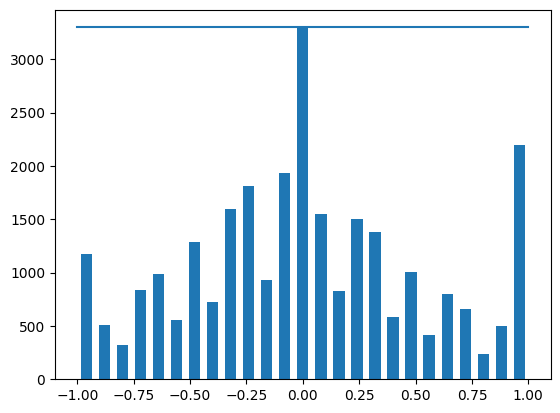

In [98]:
hist,bins = np.histogram(data['steering'],num_bins)
plt.bar(centre, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))
plt.show()

In [99]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 66268
Valid Samples: 16568


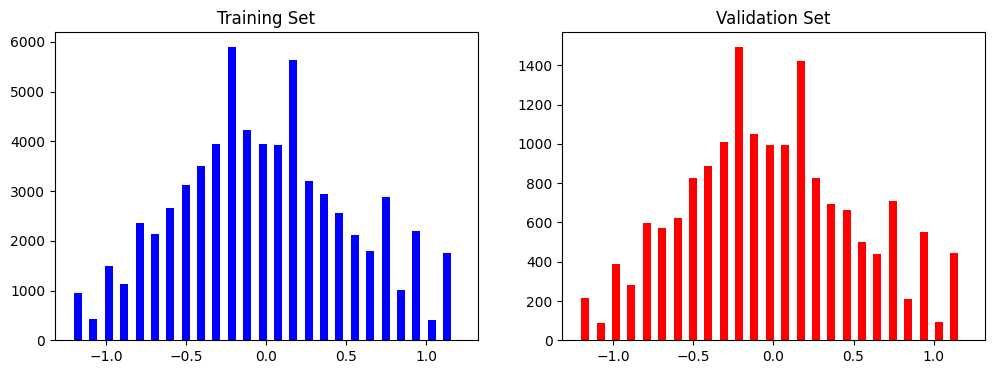

In [100]:
fig, axes = plt.subplots(1,2, figsize=(12,4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training Set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation Set')
plt.show()

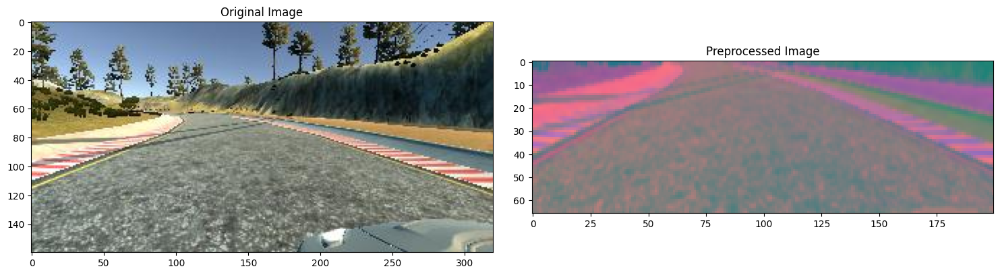

In [101]:
image = image_paths[100]
original_img = mpimg.imread(image)
preprocessed_img = preprocess_img(image)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_img)
axes[1].set_title('Preprocessed Image')
plt.show()

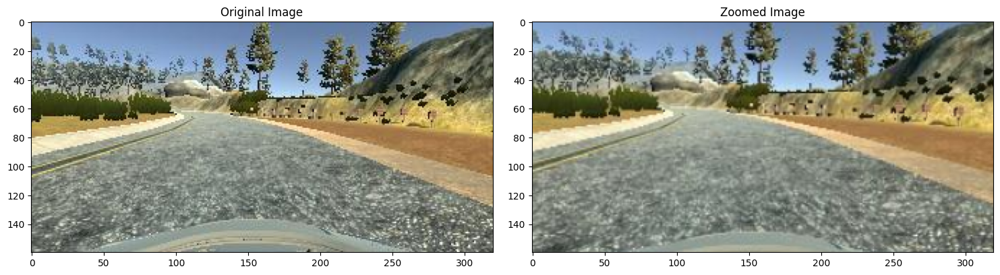

In [102]:
image = image_paths[random.randint(0,1000)]
original_img = mpimg.imread(image)
zoomed_image = zoom(original_img)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[1].imshow(zoomed_image)
axes[1].set_title('Zoomed Image')
plt.show()

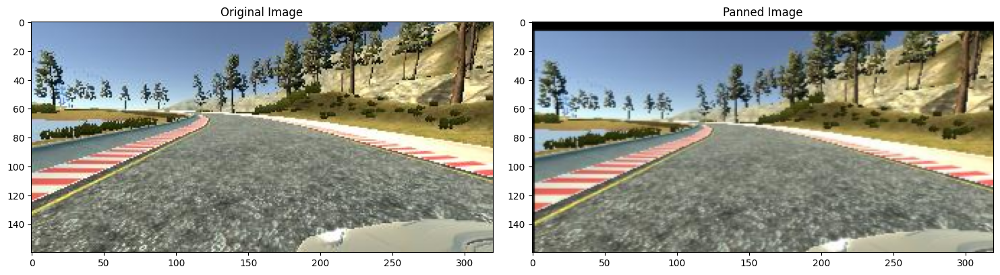

In [103]:
image = image_paths[random.randint(0,1000)]
original_img = mpimg.imread(image)
panned_image = pan(original_img)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[1].imshow(panned_image)
axes[1].set_title('Panned Image')
plt.show()

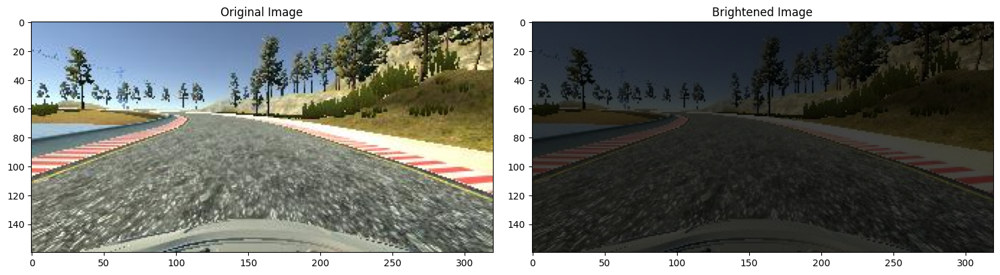

In [104]:
image = image_paths[random.randint(0,1000)]
original_img = mpimg.imread(image)
brightened_image = img_random_brightness(original_img)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[1].imshow(brightened_image)
axes[1].set_title('Brightened Image')
plt.show()

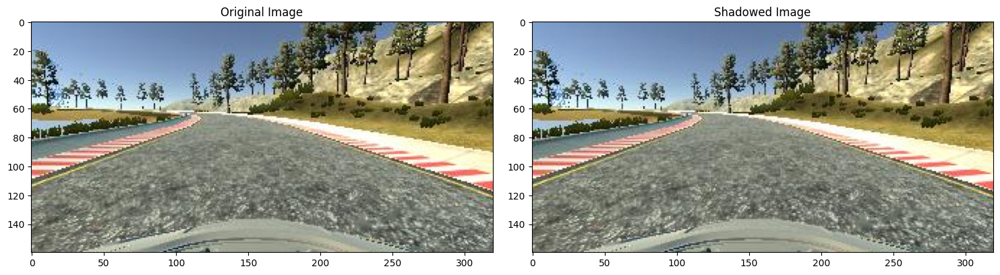

In [105]:
image = image_paths[random.randint(0,1000)]
original_img = mpimg.imread(image)
shadowed_image = random_shadow(original_img)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[1].imshow(shadowed_image)
axes[1].set_title('Shadowed Image')
plt.show()

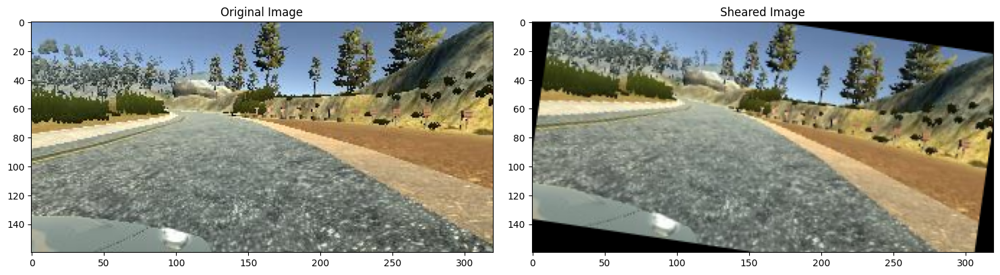

In [106]:
image = image_paths[random.randint(0,1000)]
original_img = mpimg.imread(image)
sheared_image = img_random_shear(original_img)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[1].imshow(sheared_image)
axes[1].set_title('Sheared Image')
plt.show()

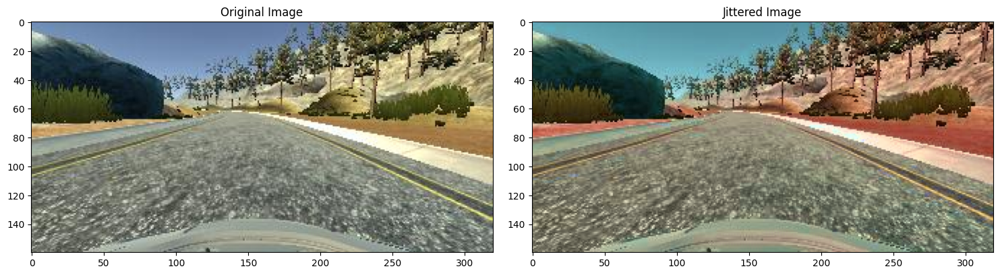

In [107]:
image = image_paths[random.randint(0,1000)]
original_img = mpimg.imread(image)
jittered_image = img_random_color_jitter(original_img)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[1].imshow(jittered_image)
axes[1].set_title('Jittered Image')
plt.show()

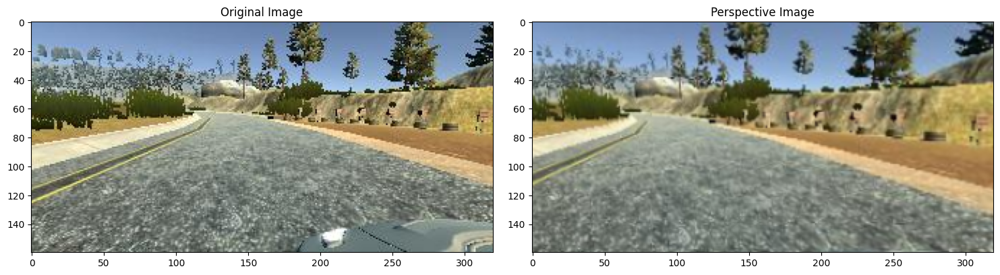

In [108]:
image = image_paths[random.randint(0,1000)]
original_img = mpimg.imread(image)
perspective_image = img_perspective_transform(original_img)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[1].imshow(perspective_image)
axes[1].set_title('Perspective Image')
plt.show()

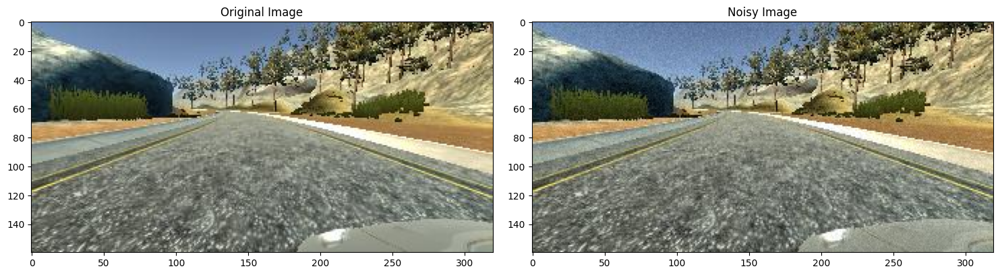

In [109]:
image = image_paths[random.randint(0,1000)]
original_img = mpimg.imread(image)
noisy_image = img_random_noise(original_img)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[1].imshow(noisy_image)
axes[1].set_title('Noisy Image')
plt.show()

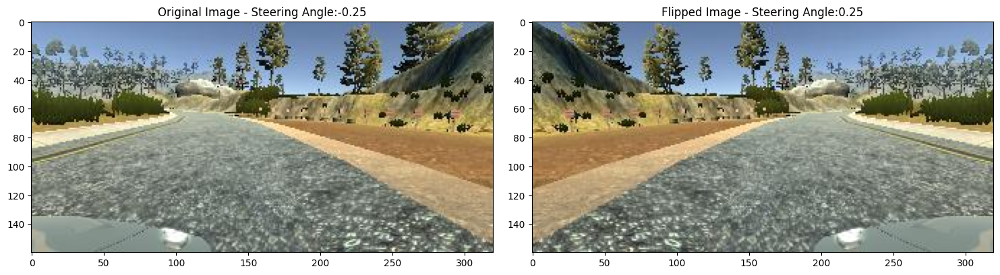

In [110]:
random_index = random.randint(0,1000)
image = image_paths[random_index]
steering = steerings[random_index]
original_img = mpimg.imread(image)
flipped_image, flipped_steering = img_random_flip(original_img,steering)
fig, axes = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_img)
axes[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering))
axes[1].imshow(flipped_image)
axes[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering))
plt.show()

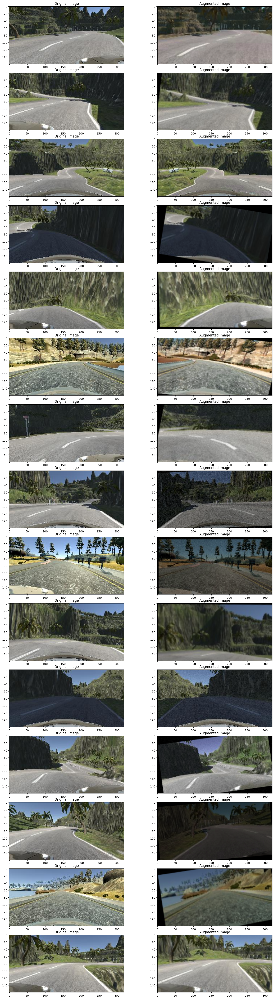

In [111]:
ncols = 2
nrows = 15
fig, axes = plt.subplots(nrows, ncols, figsize=(15,50))
fig.tight_layout()
for i in range(15):
  randnum = random.randint(0,len(image_paths)-1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
  original_img = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image,random_steering)
  axes[i][0].imshow(original_img)
  axes[i][0].set_title('Original Image')
  axes[i][1].imshow(augmented_image)
  axes[i][1].set_title('Augmented Image')
plt.show()

In [112]:
model = nvidia_model()
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_6 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_7 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_8 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_9 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten_1 (Flatten)         (None, 1152)              0         
                                                                 
 dense_4 (Dense)             (None, 100)              

In [113]:
history = model.fit(batch_generator(X_train, y_train, 300, 1),steps_per_epoch=150,epochs=30,validation_data=batch_generator(X_valid, y_valid, 300, 0),validation_steps=200,verbose=1,shuffle=1)

Epoch 1/30
150/150 [==============================] - 474s 3s/step - loss: 0.2722 - val_loss: 0.2300
Epoch 2/30
150/150 [==============================] - 458s 3s/step - loss: 0.2408 - val_loss: 0.2080
Epoch 3/30
150/150 [==============================] - 490s 3s/step - loss: 0.2307 - val_loss: 0.1724
Epoch 4/30
150/150 [==============================] - 485s 3s/step - loss: 0.2180 - val_loss: 0.1657
Epoch 5/30
150/150 [==============================] - 485s 3s/step - loss: 0.2026 - val_loss: 0.1416
Epoch 6/30
150/150 [==============================] - 485s 3s/step - loss: 0.1972 - val_loss: 0.1302
Epoch 7/30
150/150 [==============================] - 491s 3s/step - loss: 0.1898 - val_loss: 0.1319
Epoch 8/30
150/150 [==============================] - 484s 3s/step - loss: 0.1860 - val_loss: 0.1268
Epoch 9/30
150/150 [==============================] - 443s 3s/step - loss: 0.1798 - val_loss: 0.1244
Epoch 10/30
150/150 [==============================] - 483s 3s/step - loss: 0.1772 - val_lo

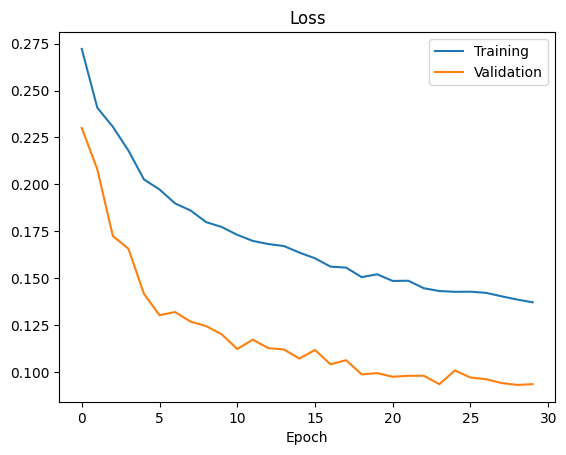

In [114]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training','Validation'])
plt.title('Loss')
plt.xlabel('Epoch')
plt.show()

In [115]:
model.save('trackOneVerTwo_Colab_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [116]:
!ls
from google.colab import files
files.download('trackOneVerTwo_Colab_model.h5')

Images_CA2  sample_data  trackOneVerTwo_Colab_model.h5


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>